# A Novel Approach to Radiometric Identification
We solve the problem of identifying transmitters by analyzing experimental data collected with the help of Adalm Pluto. We apply CaPoNeF approach and have a very good results.

We also use statistcs and LIME-analysis to reduse the space of parametrs (features) from 10 to 3.

More details in the article are written [here](https://www.researchgate.net/publication/346631096_A_Novel_Approach_to_Radiometric_Identification).

The dataset and its description can be found [here](https://github.com/svdprima)

In [1]:
import pandas as pd
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn import datasets
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
%config InlineBackend.figure_format = 'svg'

from IPython.core.pylabtools import figsize


# Data description

In [4]:
colnames = ["P1", "P2", "P3", "P4", "P5", "P6", "P7", "P8", "P9", "P10", "y"]
#colnames = ["Mean", "Max-Min", "Max-|Min|", "sumYup - sumYdn", "(Max-Mean)/(Mean-Min))", "numYup - numYdn",
#            "maxBd", "RangeJDy", "F", "Ph", "y"]

data = pd.read_csv('TXID_Dataset_diff_power_and_angle.txt', sep=",", names=colnames, header=None)

data.loc[data['y'] == 2, 'y'] = 0

In [5]:
data.head(3)

,P1,P2,P3,P4,P5,P6,P7,P8,P9,P10,y
0,0.022015,3.1392,0.000556,370.18,0.97268,-10,189.81,16.507,1.3480,1.6495,1
1,0.093699,3.1072,0.005238,395.86,0.88924,44,220.58,15.444,1.4169,1.9905,1
2,-0.005187,3.1297,0.006281,375.97,1.01070,16,185.90,12.435,1.4973,1.4321,1


In [6]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30000 entries, 0 to 29999
Data columns (total 11 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   P1      30000 non-null  float64
 1   P2      30000 non-null  float64
 2   P3      30000 non-null  float64
 3   P4      30000 non-null  float64
 4   P5      30000 non-null  float64
 5   P6      30000 non-null  int64  
 6   P7      30000 non-null  float64
 7   P8      30000 non-null  float64
 8   P9      30000 non-null  float64
 9   P10     30000 non-null  float64
 10  y       30000 non-null  int64  
dtypes: float64(9), int64(2)
memory usage: 2.5 MB


In [7]:
# Statistics for each column
data.describe()

,P1,P2,P3,P4,P5,P6,P7,P8,P9,P10,y
count,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000
mean,0.000338,3.127530,-0.000036,394.550692,1.019870,-1.782333,196.576115,10.707316,1.491727,1.564319,0.500000
std,0.158168,0.012864,0.011031,63.381648,0.203628,98.864533,50.491112,4.944943,0.104961,0.905783,0.500008
min,-0.521510,2.923600,-0.131790,144.020000,0.469500,-238.000000,62.596000,2.102800,1.132000,0.000004,0.000000
25%,-0.085984,3.123400,-0.004410,366.100000,0.909595,-54.000000,168.517500,7.020150,1.418700,0.783515,0.000000
50%,-0.012002,3.130900,0.000010,393.125000,1.015400,-8.000000,192.195000,9.091400,1.497500,1.558900,0.500000
75%,0.073702,3.135800,0.004400,422.022500,1.115800,42.000000,217.080000,13.674000,1.568600,2.346300,1.000000
max,0.561290,3.141600,0.142190,647.250000,1.990600,258.000000,435.230000,35.454000,1.816900,3.141500,1.000000


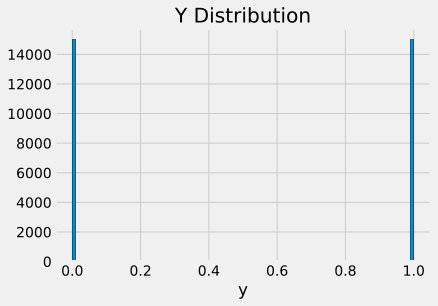

In [8]:
# Histogram of the Traget Value
plt.style.use('fivethirtyeight')
plt.hist(data['y'], bins = 100, edgecolor = 'k');
plt.xlabel('y'); 
plt.title('Y Distribution');

In [9]:
data['y'].value_counts()

1    15000
0    15000
Name: y, dtype: int64

# Feature correlation analysis
Since the problem of binary classification is being solved, the point biserial correlation coefficient is used

In [10]:
import pandas as pd
from scipy.stats import pointbiserialr

# pbc of first question
pbc = pointbiserialr(data['y'], data['P1'])
print(pbc)

PointbiserialrResult(correlation=-0.017867858412942667, pvalue=0.001968646930804034)


In [11]:
numerical_columns = ["P1", "P2", "P3", "P4", "P5", "P6", "P7", "P8", "P9", "P10"]
numerical_subset = data [numerical_columns]

In [12]:
#1) Point Biserial Correlation
pbc_list=[]
for l in numerical_subset.columns:
    pbc = pointbiserialr (numerical_subset[l], data['y'])
    pbc_list.append ([pbc[0], pbc[1],l])

pbc_list.sort(key=lambda x: x[0], reverse=True)  
print ("PBC_Coeff","P-value","Name")
for i in range (len(pbc_list)):
    #print (round(sp_list[i][0],4), round(sp_list[i][1],4), sp_list[i][2])
    print (round(pbc_list[i][0],4), round(pbc_list[i][1],4), pbc_list[i][2])

PBC_Coeff P-value Name
0.4293 0.0 P8
0.3025 0.0 P9
0.1227 0.0 P2
-0.0003 0.9517 P10
-0.0008 0.8839 P3
-0.0053 0.3602 P4
-0.0163 0.0047 P6
-0.0173 0.0027 P7
-0.0179 0.002 P1
-0.0662 0.0 P5


In [13]:
#Correlation coefficient for dichotomous and absolute variabl
def histogram_intersection(a, b):
    v = pointbiserialr (a, b)
    return v [0]

# Heat map. 
Allows you to evaluate which characteristics affect the class label. And also find internal correlations of features. It makes sense to exclude one of a couple of such features from the analysis. Typically, this increases the accuracy of the model while decreasing its complexity.

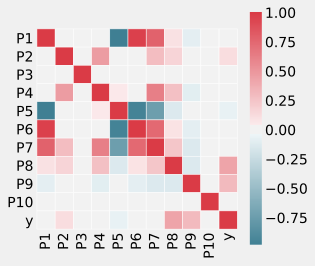

In [14]:
f, ax = plt.subplots(figsize=(4, 4))
#corr = numerical_subset_y.corr(method="spearman")
corr = data.corr(method=histogram_intersection)
sns.heatmap(corr, mask=np.zeros_like(corr, dtype=np.bool), cmap=sns.diverging_palette(220, 10, as_cmap=True),
            square=True, ax=ax, linewidths=.5)

We see that separately on the target variable there is no strong influence of individual features

We are now using **Spearman's correlation coefficient** because we are analyzing cross-correlation of numeric features. The types of the compared scales have changed.

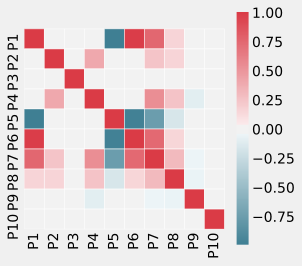

In [15]:
f, ax = plt.subplots(figsize=(4, 4))
corr = numerical_subset.corr(method="spearman")
sns.heatmap(corr, mask=np.zeros_like(corr, dtype=np.bool), cmap=sns.diverging_palette(220, 10, as_cmap=True),
            square=True, ax=ax, linewidths=.5)

# Features plot


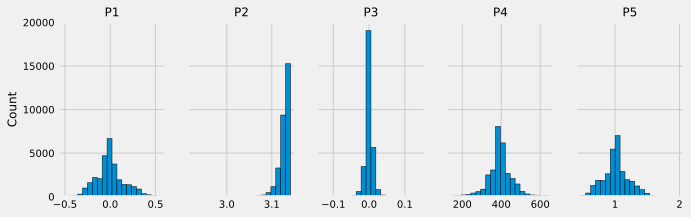

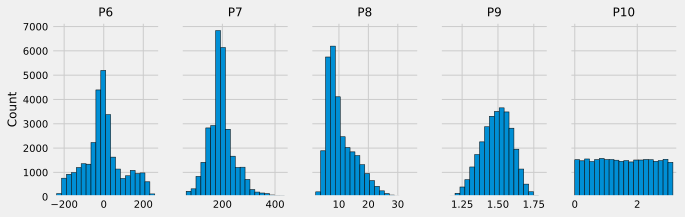

In [16]:
# Create two subplots and unpack the output array immediately
#f, ((ax1, ax2, ax3, ax4, ax5), (ax6, ax7, ax8, ax9, ax10) )= plt.subplots(2, 5, sharey=True, figsize=(10, 6))

f1, ((ax1, ax2, ax3, ax4, ax5))= plt.subplots(1, 5, sharey=True, figsize=(10, 3))
f2, ((ax6, ax7, ax8, ax9, ax10) )= plt.subplots(1, 5, sharey=True, figsize=(10, 3))

ax1.tick_params(axis='both', which='major', labelsize=10)
ax1.tick_params(axis='both', which='minor', labelsize=8)
ax2.tick_params(axis='both', which='major', labelsize=10)
ax2.tick_params(axis='both', which='minor', labelsize=8)
ax3.tick_params(axis='both', which='major', labelsize=10)
ax3.tick_params(axis='both', which='minor', labelsize=8)
ax4.tick_params(axis='both', which='major', labelsize=10)
ax4.tick_params(axis='both', which='minor', labelsize=8)
ax5.tick_params(axis='both', which='major', labelsize=10)
ax5.tick_params(axis='both', which='minor', labelsize=8)
ax6.tick_params(axis='both', which='major', labelsize=10)
ax6.tick_params(axis='both', which='minor', labelsize=8)
ax7.tick_params(axis='both', which='major', labelsize=10)
ax7.tick_params(axis='both', which='minor', labelsize=8)
ax8.tick_params(axis='both', which='major', labelsize=10)
ax8.tick_params(axis='both', which='minor', labelsize=8)
ax9.tick_params(axis='both', which='major', labelsize=10)
ax9.tick_params(axis='both', which='minor', labelsize=8)
ax10.tick_params(axis='both', which='major', labelsize=10)
ax10.tick_params(axis='both', which='minor', labelsize=8)

ax1.hist(data['P1'], bins = 20, edgecolor = 'black');
ax1.set_title('P1', size=12);
ax1.set_ylabel('Count', size=12)

ax2.hist(data['P2'], bins = 20, edgecolor = 'black');
ax2.set_title('P2', size=12);

ax3.hist(data['P3'], bins = 20, edgecolor = 'black');
ax3.set_title('P3', size=12);

ax4.hist(data['P4'], bins = 20, edgecolor = 'black');
ax4.set_title('P4', size=12);

ax5.hist(data['P5'], bins = 20, edgecolor = 'black');
ax5.set_title('P5', size=12);

ax6.hist(data['P6'], bins = 20, edgecolor = 'black');
ax6.set_title('P6', size=12);
ax6.set_ylabel('Count', size=12)

ax7.hist(data['P7'], bins = 20, edgecolor = 'black');
ax7.set_title('P7', size=12);

ax8.hist(data['P8'], bins = 20, edgecolor = 'black');
ax8.set_title('P8', size=12);

ax9.hist(data['P9'], bins = 20, edgecolor = 'black');
ax9.set_title('P9', size=12);

ax10.hist(data['P10'], bins = 20, edgecolor = 'black');
ax10.set_title('P10', size=12);

f1.savefig("bar_21.jpeg", dpi=400, transparent=True, bbox_inches='tight')
f2.savefig("bar_22.jpeg", dpi=400, transparent=True, bbox_inches='tight')

In [17]:
# Imputing missing values and scaling values
from sklearn.preprocessing import MinMaxScaler

# Machine Learning Models
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor

# Hyperparameter tuning
from sklearn.model_selection import RandomizedSearchCV, GridSearchCV

In [18]:
train_data = numerical_subset

targets = data ["y"]

In [19]:
from sklearn.model_selection import ShuffleSplit
#next(ShuffleSplit().split(X, y))

X, X_test, train_labels, test_labels = train_test_split(train_data, targets,
                                                        test_size = 0.3,random_state = 42, shuffle=True, stratify=targets)


In [20]:
# Create the scaler object with a range of 0-1
scaler = MinMaxScaler(feature_range=(0, 1))

# Fit on the training data
scaler.fit(X)

# Transform both the training and testing data
X = scaler.transform(X)
X_test = scaler.transform(X_test)

In [21]:
# Convert y to one-dimensional array (vector)
y = np.array(train_labels).reshape((-1, ))
y_test = np.array(test_labels).reshape((-1, ))

# Machine Learning
We use common ML from the great sklearn library

In [22]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import roc_auc_score
from sklearn.metrics import accuracy_score

In [23]:
# Takes in a model, trains the model, and evaluates the model on the test set
def fit_and_evaluate_test(model):
    
    # Train the model
    model.fit(X, y)
    
    # Make predictions and evalute
    model_pred = model.predict(X_test)
    roc_auc = roc_auc_score(y_test, model_pred)
    accuracy = accuracy_score(y_test, model_pred)

    print (accuracy, roc_auc)
    
    # Return the performance metric
    return accuracy

In [24]:
dtc = DecisionTreeClassifier(random_state=60)
dtc_accuracy = fit_and_evaluate_test(dtc)

print('DecisionTreeClassifier Performance on the test set: accuracy = %0.4f' % dtc_accuracy)

0.9826666666666667 0.9826666666666667
DecisionTreeClassifier Performance on the test set: accuracy = 0.9827


In [25]:
lr = LogisticRegression(random_state=60, max_iter = 10000)
lr_accuracy = fit_and_evaluate_test(lr)

print('LogisticRegression Performance on the test set: accuracy = %0.4f' % lr_accuracy)

0.7774444444444445 0.7774444444444445
LogisticRegression Performance on the test set: accuracy = 0.7774


In [26]:
from sklearn.svm import SVC

svm = SVC(kernel='linear', C=1.0, random_state=1)
svm_accuracy = fit_and_evaluate_test(svm)

print('SVC Performance on the test set: accuracy = %0.4f' % svm_accuracy)

0.8004444444444444 0.8004444444444445
SVC Performance on the test set: accuracy = 0.8004


In [27]:
svm_rbf = SVC(kernel='rbf', random_state=1, gamma=0.10, C=10.0)

svm_rbf_accuracy = fit_and_evaluate_test(svm_rbf)

print('nonLinear SVC Performance on the test set: accuracy = %0.4f' % svm_rbf_accuracy)

0.9244444444444444 0.9244444444444445
nonLinear SVC Performance on the test set: accuracy = 0.9244


In [28]:
from sklearn.tree import DecisionTreeClassifier

tree = DecisionTreeClassifier(criterion='gini', max_depth=30, random_state=1)
tree_accuracy = fit_and_evaluate_test(tree)

print('DecisionTreeClassifier Performance on the test set: accuracy = %0.4f' % tree_accuracy)

0.9827777777777778 0.9827777777777779
DecisionTreeClassifier Performance on the test set: accuracy = 0.9828


In [29]:
# Создаём модель леса из сотни деревьев
forest = RandomForestClassifier(n_estimators=100, 
                               bootstrap = True,
                               max_features = 'sqrt')
forest_accuracy = fit_and_evaluate_test(forest)

print('Forest Performance on the test set: roc_auc = %0.4f' % forest_accuracy)

0.9895555555555555 0.9895555555555555
Forest Performance on the test set: roc_auc = 0.9896


In [30]:
from sklearn.neighbors import KNeighborsClassifier

knn = KNeighborsClassifier(n_neighbors=5, p=2, metric='minkowski')
knn_accuracy = fit_and_evaluate_test(knn)

print('KNeighborsClassifier Performance on the test set: accuracy = %0.4f' % knn_accuracy)

0.983 0.9830000000000001
KNeighborsClassifier Performance on the test set: accuracy = 0.9830


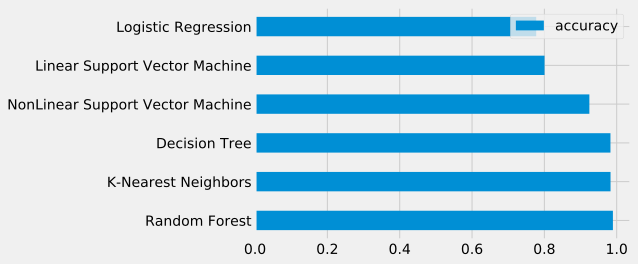

In [31]:
accuracy_list2 = [lr_accuracy, svm_accuracy, svm_rbf_accuracy, tree_accuracy, 
                                         forest_accuracy, knn_accuracy]


index = ["Logistic Regression",'Linear Support Vector Machine', 'NonLinear Support Vector Machine',
                                           'Decision Tree', 'Random Forest',
                                            'K-Nearest Neighbors']
df = pd.DataFrame({'accuracy': accuracy_list2}, index=index)
df=df.sort_values('accuracy',ascending = False)
ax = df.plot.barh()

In [32]:
#n_estimators - число деревьев
forest = RandomForestClassifier(n_estimators=100, 
                               bootstrap = True,
                               max_features = 'sqrt')

parameters = {'n_estimators': [60, 70, 80, 90, 100, 110], 'max_depth': [2,3,4,5,6,7,8,9,10]}
grid_search_cv_clf = GridSearchCV(forest, parameters, cv=5, n_jobs=-1)
grid_search_cv_clf.fit(X, y)

GridSearchCV(cv=5, error_score=nan,
             estimator=RandomForestClassifier(bootstrap=True, ccp_alpha=0.0,
                                              class_weight=None,
                                              criterion='gini', max_depth=None,
                                              max_features='sqrt',
                                              max_leaf_nodes=None,
                                              max_samples=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators=100, n_jobs=None,
                                              oob_score=False,
                                              rando

In [33]:
grid_search_cv_clf.best_params_ 

{'max_depth': 10, 'n_estimators': 100}

In [34]:
best_clf = grid_search_cv_clf.best_estimator_

In [35]:
grid_search_cv_clf.best_params_
best_clf.score(X_test, y_test)

0.9891111111111112

In [36]:
forest_accuracy_best = fit_and_evaluate_test(best_clf)

print('Forest Performance on the test set: accuracy = %0.4f' % forest_accuracy_best)

0.9877777777777778 0.9877777777777778
Forest Performance on the test set: accuracy = 0.9878


In [41]:
# Number of trees used in the boosting process
n_estimators = [80, 85, 90, 95, 100, 110, 120, 130, 140, 150, 160, 170, 180, 190, 200]

# Maximum depth of each tree
max_depth = [3, 4, 5, 6, 7]

# Minimum number of samples per leaf
min_samples_leaf = [3, 4, 5, 6]

# Minimum number of samples to split a node
min_samples_split = [8, 9, 10, 11, 12, 13, 14]

# Maximum number of features to consider for making splits
max_features = ['auto', 'sqrt', 'log2', None]

# Define the grid of hyperparameters to search
hyperparameter_grid = {
                       'n_estimators': n_estimators,
                       'max_depth': max_depth,
                       'min_samples_leaf': min_samples_leaf,
                       'min_samples_split': min_samples_split,
                       'max_features': max_features}

# Feature Importances

One of the basic ways we can interpret an ensemble of decision trees is through what are known as the feature importances. These can be interpreted as the variables which are most predictive of the target. While the actual details of the feature importances are quite complex ([here is a Stack Overflow question on the subject](https://stackoverflow.com/questions/15810339/how-are-feature-importances-in-randomforestclassifier-determined), we can use the relative values to compare the features and determine which are most relevant to our problem.

Extracting the feature importances from a trained ensemble of trees is quite easy in scikit-learn. We will store the feature importances in a dataframe to analyze and visualize them.

## Decision-tree coefs
In this section we'll have a look at feature importance calculation in Decision Trees. It is the most common and easiest way to analyse feature importance.

In [73]:
# Extract the feature importances into a dataframe
feature_results = pd.DataFrame({'feature': list(train_data.columns), 
                                #'importance': model.feature_importances_})
                                'importance': best_clf.feature_importances_})

# Show the top most important
feature_results = feature_results.sort_values('importance', ascending = False).reset_index(drop=True)

feature_results.head(10)

ValueError: arrays must all be same length

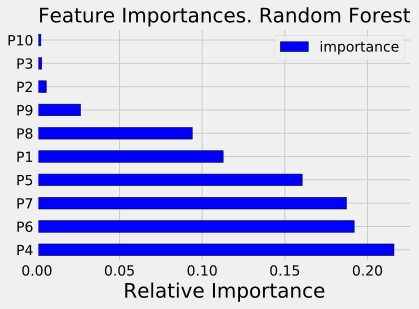

In [38]:
plt.style.use('fivethirtyeight')

# Plot the 10 most important features in a horizontal bar chart
feature_results.loc[:9, :].plot(x = 'feature', y = 'importance', 
                                 edgecolor = 'k',
                                 kind='barh', color = 'blue');
plt.xlabel('Relative Importance', size = 20); plt.ylabel('')
plt.title('Feature Importances. Random Forest', size = 20);

plt.savefig("featureImp.jpeg", dpi=400, transparent=True, bbox_inches='tight')

# LIME 

**Local Interpretable Model-agnostic Explanations**

This new approach will allow you to understand how complex models work, considering local areas (individual objects) and describing the behavior of features on these objects.

More details can be found [here](https://github.com/marcotcr/lime)

In [39]:
model = RandomForestClassifier(n_estimators=100, 
                               bootstrap = True,
                               max_features = 'sqrt')
#forest_accuracy = fit_and_evaluate_test(forest)

model.fit(X, y)
    
# Make predictions and evalute
#model_pred = model.predict(X_test)
model_pred = model.predict_proba(X_test)

In [40]:
# Find the residuals
residuals = np.zeros(len(y_test))
for i in range (len(y_test)):
    if (y_test[i] == 0) and (model_pred[i][0]>=0.5):
        residuals[i] = model_pred[i][1]
    if (y_test[i] == 1) and (model_pred[i][1]>=0.5):
        residuals[i] = model_pred[i][0]
        
    if (y_test[i] == 0) and (model_pred[i][1]<0.5):
        residuals[i] = model_pred[i][1]
    if (y_test[i] == 1) and (model_pred[i][1]<0.5):
        residuals[i] = model_pred[i][0]

        
#residuals = abs(model_pred - y_test)
    
# Exact the worst and best prediction
wrong = X_test[np.argmax(residuals), :]
right = X_test[np.argmin(residuals), :]

In [41]:
import lime 
import lime.lime_tabular

In [42]:
feature_results

,feature,importance
0,P4,0.216038
1,P6,0.191973
2,P7,0.187303
3,P5,0.160512
4,P1,0.112701
5,P8,0.093992
6,P9,0.026415
7,P2,0.005675
8,P3,0.002968
9,P10,0.002423


In [43]:
# Create a lime explainer object
most_important_features = feature_results['feature']
explainer = lime.lime_tabular.LimeTabularExplainer(training_data = X, 
                                                   mode = 'classification',
                                                   training_labels = y,
                                                   feature_names = list(most_important_features))

Prediction: 0.0000
[[0.99 0.01]]
Actual Value: 1.0000


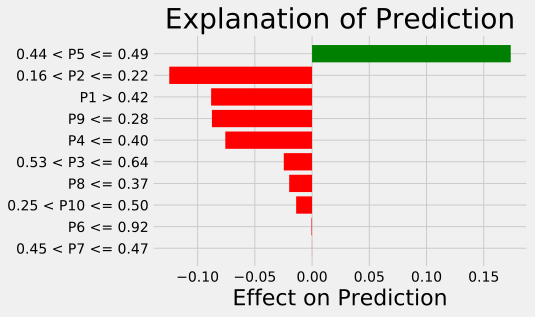

In [44]:
# Display the predicted and true value for the wrong instance
print('Prediction: %0.4f' % model.predict(wrong.reshape(1, -1)))
print (model.predict_proba(wrong.reshape(1, -1)))
print('Actual Value: %0.4f' % y_test[np.argmax(residuals)])

# Explanation for wrong prediction
wrong_exp = explainer.explain_instance(data_row = wrong, 
                                       predict_fn = model.predict_proba)

# Plot the prediction explaination
wrong_exp.as_pyplot_figure();
plt.title('Explanation of Prediction', size = 28);
plt.xlabel('Effect on Prediction', size = 22);

plt.savefig("featureImp.JPEG", dpi=400, transparent=True, bbox_inches='tight')

In [45]:
wrong_exp.show_in_notebook(show_predicted_value=False)

Prediction: 0.0000
[[1. 0.]]
Actual Value: 0.0000


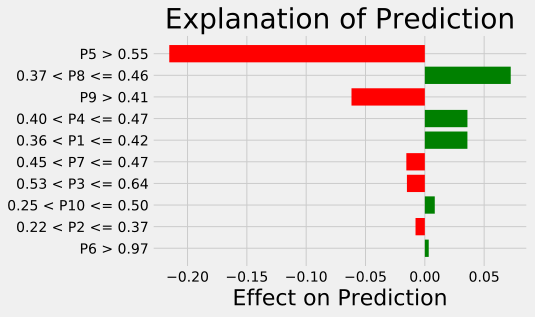

In [46]:
# Display the predicted and true value for the wrong instance
print('Prediction: %0.4f' % model.predict(right.reshape(1, -1)))
print (model.predict_proba(right.reshape(1, -1)))
print('Actual Value: %0.4f' % y_test[np.argmin(residuals)])

# Explanation for wrong prediction
right_exp = explainer.explain_instance(right, model.predict_proba, num_features=10)
right_exp.as_pyplot_figure();
plt.title('Explanation of Prediction', size = 28);
plt.xlabel('Effect on Prediction', size = 22);

plt.savefig("featureImp2.JPEG", dpi=400, transparent=True, bbox_inches='tight')

In [47]:
right_exp.show_in_notebook(show_predicted_value=False)

# Experiments on removing the features

In [48]:
colnames = ["Mean", "Max-Min", "Max-|Min|", "sumYup - sumYdn", "(Max-Mean)/(Mean-Min))", "numYup - numYdn",
            "maxBd", "RangeJDy", "F", "Ph", "y"]

#data = pd.read_csv('TXID_Dataset_complete.txt', sep=",", names=colnames, header=None)
data = pd.read_csv('TXID_Dataset_diff_power_and_angle.txt', sep=",", names=colnames, header=None)

data.loc[data['y'] == 2, 'y'] = 0

numerical_columns = ["Mean", "Max-Min", "Max-|Min|", "sumYup - sumYdn", "(Max-Mean)/(Mean-Min))", "numYup - numYdn",
            "maxBd", "RangeJDy", "F", "Ph"]
numerical_subset = data [numerical_columns]

In [49]:
import copy
train_data = copy.copy(numerical_subset)
targets = data ["y"]

#train_data = train_data.drop(['(Max-Mean)/(Mean-Min))', "numYup - numYdn"], axis=1)

#train_data = train_data.drop(['(Max-Mean)/(Mean-Min))', "numYup - numYdn", "maxBd"], axis=1)

#train_data = train_data.drop(['(Max-Mean)/(Mean-Min))', "numYup - numYdn", "maxBd", "Ph"], axis=1)

#train_data = train_data.drop(["Mean", "Max-Min", "Max-|Min|", "sumYup - sumYdn", "maxBd", "F", "Ph"], axis=1)

#In such case we have only the most important features
train_data = train_data.drop([ "Max-Min", "Max-|Min|", "numYup - numYdn","maxBd", "F", "Ph","Mean"], axis=1)

In [50]:
train_data.head(1)

,sumYup - sumYdn,(Max-Mean)/(Mean-Min)),RangeJDy
0,370.18,0.97268,16.507


In [51]:
X, X_test, y, y_test = train_test_split(train_data, targets,
                                                        test_size = 0.3,random_state = 42, shuffle=True, stratify=targets)

In [52]:
# Create the scaler object with a range of 0-1
scaler = MinMaxScaler(feature_range=(0, 1))

# Fit on the training data
scaler.fit(X)

# Transform both the training and testing data
X = scaler.transform(X)
X_test = scaler.transform(X_test)


y = np.array(y).reshape((-1, ))
y_test = np.array(y_test).reshape((-1, ))

In [53]:
# Takes in a model, trains the model, and evaluates the model on the test set
def fit_and_evaluate_test(model):
    
    # Train the model
    model.fit(X, y)
    
    # Make predictions and evalute
    model_pred = model.predict(X_test)
    roc_auc = roc_auc_score(y_test, model_pred)
    accuracy = accuracy_score(y_test, model_pred)

    print (accuracy, roc_auc)
    
    # Return the performance metric
    return accuracy

In [54]:
print (y.shape)
print (X.shape)
print (y_test.shape)

print (X_test.shape)

(21000,)
(21000, 3)
(9000,)
(9000, 3)


In [55]:
forest = RandomForestClassifier(n_estimators=110, 
                               bootstrap = True,
                               max_features = 'sqrt',
                               max_depth= 10,
                               random_state = 42)

In [56]:
# Number of trees used in the boosting process
n_estimators = [80, 85, 90, 95, 100, 110, 120, 130]

# Maximum depth of each tree
max_depth = [4, 5, 6, 7]

# Minimum number of samples per leaf
min_samples_leaf = [3, 4, 5, 6]

# Minimum number of samples to split a node
min_samples_split = [8, 9, 10, 11, 12]

# Maximum number of features to consider for making splits
max_features = ['auto', 'sqrt', 'log2', None]

# Define the grid of hyperparameters to search
hyperparameter_grid = {
                       'n_estimators': n_estimators,
                       'max_depth': max_depth,
                       'min_samples_leaf': min_samples_leaf,
                       'min_samples_split': min_samples_split,
                       'max_features': max_features}

In [57]:
# Set up the random search with 4-fold cross validation
random_cv = RandomizedSearchCV(estimator=model,
                               param_distributions=hyperparameter_grid,
                               cv=4, n_iter=40, 
                               scoring = 'neg_mean_absolute_error',
                               n_jobs = -1, verbose = 1, 
                               return_train_score = True,
                               random_state=42)

In [58]:
random_cv.fit(X,y)

Fitting 4 folds for each of 40 candidates, totalling 160 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:   10.2s
[Parallel(n_jobs=-1)]: Done 160 out of 160 | elapsed:   38.4s finished


RandomizedSearchCV(cv=4, error_score=nan,
                   estimator=RandomForestClassifier(bootstrap=True,
                                                    ccp_alpha=0.0,
                                                    class_weight=None,
                                                    criterion='gini',
                                                    max_depth=None,
                                                    max_features='sqrt',
                                                    max_leaf_nodes=None,
                                                    max_samples=None,
                                                    min_impurity_decrease=0.0,
                                                    min_impurity_split=None,
                                                    min_samples_leaf=1,
                                                    min_samples_split=2,
                                                    min_weight_fraction_leaf=0.0,
               

In [59]:
final_model = random_cv.best_estimator_
final_pred = final_model.predict(X_test)

print('Final model performance on the test set: Accuracy = %0.4f.' % accuracy_score(y_test, final_pred))

Final model performance on the test set: Accuracy = 0.9859.


In [69]:
RF_acc = []
RF_val = []

for i in range(1, 140):
    final_model.n_estimators = i
    final_model.fit(X, y)
    RF_acc.append(accuracy_score(y_test, final_model.predict(X_test)))

0.9873333333333333
119


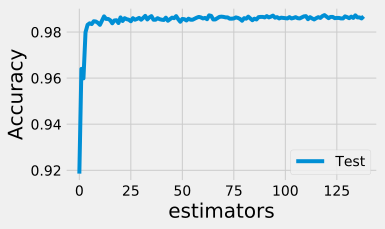

In [70]:
figsize(5, 3)
fig, ax = plt.subplots()
ax.plot(RF_acc, label="Test")
#ax.plot(RF_val, label="Validation")
legend = ax.legend()
plt.xlabel('estimators', size = 20); plt.ylabel('Accuracy', size = 20); 
print(max(RF_acc))
print(np.argmax(RF_acc))

# Feature Importances of redused feature list


In [72]:

# Extract the feature importances into a dataframe
feature_results = pd.DataFrame({'feature': list(train_data.columns), 
                                'importance': final_model.feature_importances_})

# Show the top most important
feature_results = feature_results.sort_values('importance', ascending = False).reset_index(drop=True)

feature_results.head(10)

,feature,importance
0,(Max-Mean)/(Mean-Min)),0.403777
1,sumYup - sumYdn,0.398983
2,RangeJDy,0.197240


In [78]:
final_model.estimators_[0]

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=7, max_features='sqrt', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=3, min_samples_split=9,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=1848418304, splitter='best')

In [80]:
single_tree = final_model.estimators_[0]
# Extract the names of the most important features
most_important_features = feature_results['feature'][:10]

tree.export_graphviz(single_tree, out_file = 'tree.dot',
                     rounded = True, 
                     feature_names = most_important_features,
                     filled = True)

single_tree

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=7, max_features='sqrt', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=3, min_samples_split=9,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=1848418304, splitter='best')

In [84]:

# Convert to a png from the command line
# This requires the graphviz visualization library (https://www.graphviz.org/)
!dot -Tpng tree.dot -o tree.png

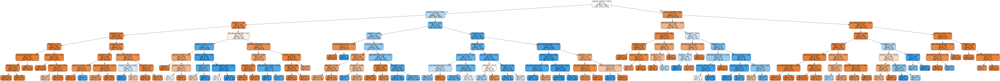

In [87]:
from IPython.display import Image
Image(filename='tree.png')

In [88]:
tree.export_graphviz(single_tree, out_file = 'tree_small.dot',
                     rounded = True, feature_names = most_important_features,
                     filled = True, max_depth = 3)

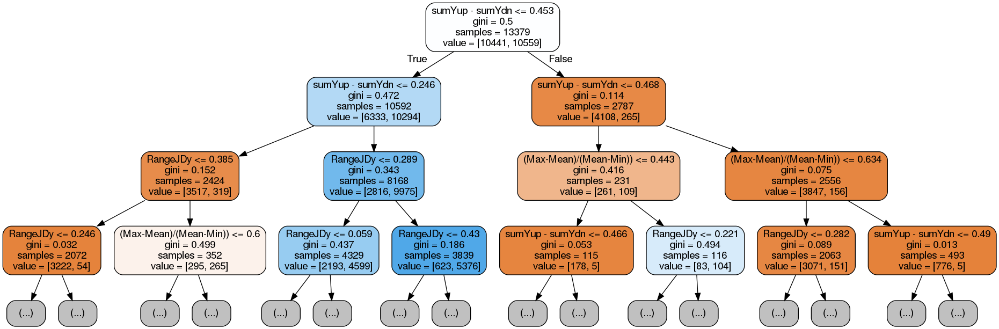

In [89]:
!dot -Tpng tree_small.dot -o tree_small.png
Image(filename='tree_small.png')

In [90]:
dtc = DecisionTreeClassifier(random_state=60)
dtc_accuracy = fit_and_evaluate_test(dtc)

print('DecisionTreeClassifier Performance on the test set: accuracy = %0.4f' % dtc_accuracy)

0.9788888888888889 0.9788888888888888
DecisionTreeClassifier Performance on the test set: accuracy = 0.9789


In [91]:
single_tree = dtc
# Extract the names of the most important features
most_important_features = feature_results['feature'][:10]

tree.export_graphviz(single_tree, out_file = 'dtc.dot',
                     rounded = True, 
                     feature_names = most_important_features,
                     filled = True)

In [92]:
!dot -Tpng dtc.dot -o dtc.png
Image(filename='dtc.png')